Data types of pathology columns:
Cardiomegaly          int64
Emphysema             int64
Effusion              int64
Hernia                int64
Nodule                int64
Pneumothorax          int64
Atelectasis           int64
Pleural_Thickening    int64
Mass                  int64
Edema                 int64
Consolidation         int64
Infiltration          int64
Fibrosis              int64
Pneumonia             int64
dtype: object
Missing values in pathology columns:
Cardiomegaly          0
Emphysema             0
Effusion              0
Hernia                0
Nodule                0
Pneumothorax          0
Atelectasis           0
Pleural_Thickening    0
Mass                  0
Edema                 0
Consolidation         0
Infiltration          0
Fibrosis              0
Pneumonia             0
dtype: int64


/home/ozien/anaconda3/envs/rapids-25.02/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/home/ozien/anaconda3/envs/rapids-25.02/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.



+--------------------+------------------+
| Class Name         |   Train Accuracy |
+====================+==================+
| Cardiomegaly       |         0.978149 |
+--------------------+------------------+
| Emphysema          |         0.984838 |
+--------------------+------------------+
| Effusion           |         0.900111 |
+--------------------+------------------+
| Hernia             |         1        |
+--------------------+------------------+
| Nodule             |         0.943367 |
+--------------------+------------------+
| Pneumothorax       |         0.955407 |
+--------------------+------------------+
| Atelectasis        |         0.909253 |
+--------------------+------------------+
| Pleural_Thickening |         0.969677 |
+--------------------+------------------+
| Mass               |         0.948272 |
+--------------------+------------------+
| Edema              |         0.989521 |
+--------------------+------------------+
| Consolidation      |         0.9

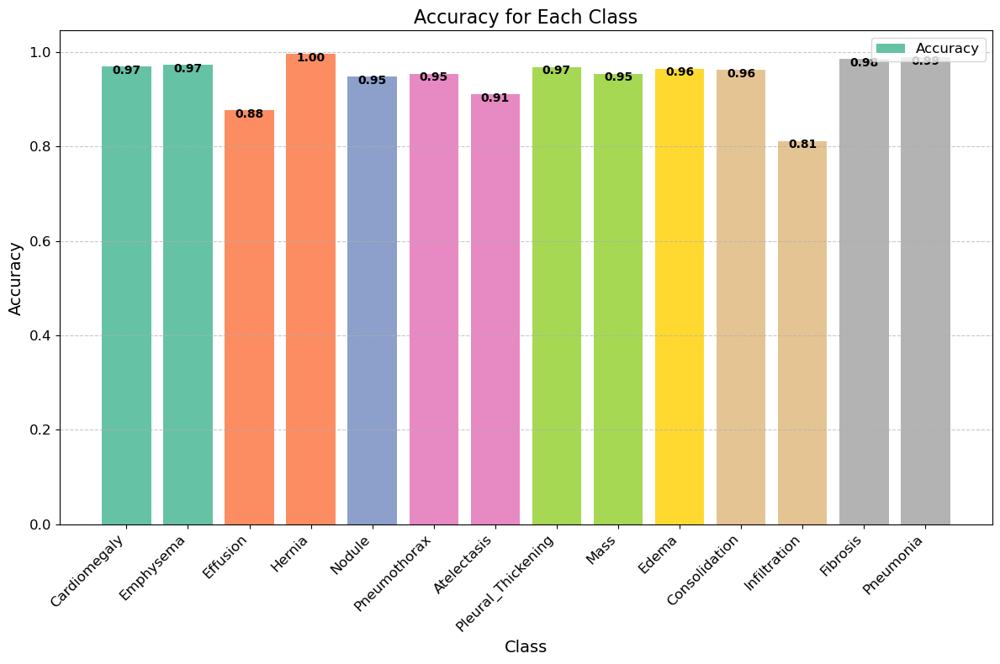

  0%|          | 0/1000 [00:00<?, ?it/s]

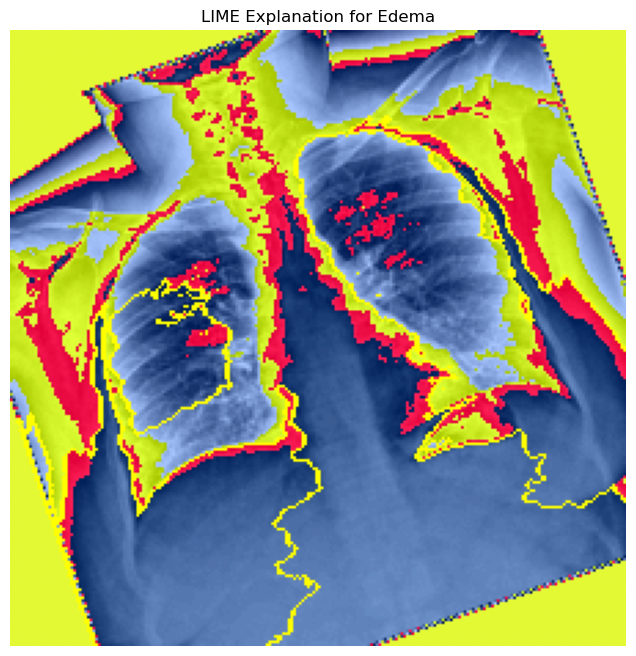

In [ ]:
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
from operator import itemgetter
from collections import OrderedDict
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
import torch
from torch import optim, nn
import torch.nn.functional as F
from torchvision import transforms as T, models
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision.utils import make_grid
from torch.utils.data import random_split
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.multioutput import MultiOutputClassifier
from sklearn.metrics import accuracy_score
from tabulate import tabulate
from lime import lime_image
from skimage.segmentation import mark_boundaries
from torchvision.transforms.functional import to_pil_image

# Set plotting backend and device
pd.options.plotting.backend = "plotly"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load and preprocess data
data = pd.read_csv(
    '/home/ozien/Untitled Folder/XAI/Data/Sample/sample_labels.csv')
data['Patient Gender'].value_counts().plot.bar()

# Handle 'Patient Age'
data['Patient Age'] = data['Patient Age'].astype(str)
data['Patient Age'] = data['Patient Age'].apply(
    lambda x: int(x[1:3]) if len(x) > 2 and x[1:3].isdigit() else None)
data = data.dropna(subset=['Patient Age'])
data['Patient Age'].plot.hist()

# Define pathology list and create binary labels
pathology_list = ['Cardiomegaly', 'Emphysema', 'Effusion', 'Hernia', 'Nodule', 'Pneumothorax', 'Atelectasis',
                  'Pleural_Thickening', 'Mass', 'Edema', 'Consolidation', 'Infiltration', 'Fibrosis', 'Pneumonia']
for pathology in pathology_list:
    data[pathology] = data['Finding Labels'].apply(
        lambda x: 1 if pathology in x else 0).astype(int)
data['No Findings'] = data['Finding Labels'].apply(
    lambda x: 1 if 'No Finding' in x else 0).astype(int)
data = data.drop(list(data.iloc[:, 1:11].columns.values), axis=1)
data.iloc[:, 1:].sum().plot.barh()
data = data.drop(['No Findings'], axis=1)
data.iloc[:, 1:].sum().plot.barh()

# Verify data types and check for missing values
print("Data types of pathology columns:")
print(data[pathology_list].dtypes)
print("Missing values in pathology columns:")
print(data[pathology_list].isna().sum())
data = data.dropna(subset=pathology_list)

# Compute class frequencies


def compute_class_freqs(labels):
    labels = np.array(labels)
    N = labels.shape[0]
    positive_frequencies = np.sum(labels, axis=0) / N
    negative_frequencies = 1 - positive_frequencies
    return positive_frequencies, negative_frequencies


freq_pos, freq_neg = compute_class_freqs(data.iloc[:, 1:])
pos_weights = freq_neg
neg_weights = freq_pos

# Dataset class


class NIH_Dataset(Dataset):
    def __init__(self, data, img_dir, transform=None):
        self.data = data
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_file = os.path.join(self.img_dir, self.data.iloc[idx, 0])
        img = Image.open(img_file).convert('RGB')
        label = torch.tensor(self.data.iloc[idx, 1:].values.astype(
            np.float32), dtype=torch.float32)
        if self.transform:
            img = self.transform(img)
        return img, label


# Data transformations
data_transform = T.Compose([
    T.RandomRotation((-20, +20)),
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create dataset and split into train/test
trainds = NIH_Dataset(
    data, img_dir='/home/ozien/Untitled Folder/XAI/Data/Sample/sample/images', transform=data_transform)
trainset, testset = random_split(trainds, [4485, 1121])
trainloader = DataLoader(trainset, batch_size=32, shuffle=True)
testloader = DataLoader(testset, batch_size=32, shuffle=True)

# Feature extraction using VGG16 convolutional base
vgg_model = models.vgg16(pretrained=True)
vgg_feature_extractor = nn.Sequential(
    vgg_model.features,                # Convolutional layers
    nn.AdaptiveAvgPool2d((1, 1)),      # Reduce to (batch_size, 512, 1, 1)
    nn.Flatten()                       # Output (batch_size, 512)
).to(device)
vgg_feature_extractor.eval()

# Function to extract features


def extract_features(loader, model):
    features = []
    labels = []
    model.eval()
    with torch.no_grad():
        for images, targets in loader:
            images = images.to(device)
            outputs = model(images)
            features.extend(outputs.cpu().numpy())
            labels.extend(targets.cpu().numpy())
    return features, labels


# Extract features for training and testing
train_features, train_labels = extract_features(
    trainloader, vgg_feature_extractor)
test_features, test_labels = extract_features(
    testloader, vgg_feature_extractor)

# Convert labels to 2D arrays
train_labels = np.vstack(train_labels)  # Shape: (n_samples, 14)
test_labels = np.vstack(test_labels)    # Shape: (n_samples, 14)
train_features = np.array(train_features)  # Shape: (n_samples, 512)
test_features = np.array(test_features)

# Apply PCA
n_components = min(len(train_features), 512, 1000)
pca = PCA(n_components=n_components)
train_features_reduced = pca.fit_transform(train_features)
test_features_reduced = pca.transform(test_features)

# Train multi-label SVM
svm_classifier = SVC(kernel='linear', probability=True)
multi_label_svm = MultiOutputClassifier(svm_classifier)
multi_label_svm.fit(train_features_reduced, train_labels)

# Predictions
train_predictions = multi_label_svm.predict(train_features_reduced)
test_predictions = multi_label_svm.predict(test_features_reduced)

# Calculate class-wise accuracies
train_labels_array = np.array(train_labels)
train_predictions_array = np.array(train_predictions)
train_class_accuracies_svm = [accuracy_score(
    train_labels_array[:, i], train_predictions_array[:, i]) for i in range(len(pathology_list))]

test_labels_array = np.array(test_labels)
test_predictions_array = np.array(test_predictions)
test_class_accuracies_svm = [accuracy_score(
    test_labels_array[:, i], test_predictions_array[:, i]) for i in range(len(pathology_list))]

# Print accuracies
data_train = zip(pathology_list, train_class_accuracies_svm)
print(tabulate(data_train, headers=[
      'Class Name', 'Train Accuracy'], tablefmt='grid'))

data_test = zip(pathology_list, test_class_accuracies_svm)
print(tabulate(data_test, headers=[
      'Class Name', 'Test Accuracy'], tablefmt='grid'))

average_test_accuracy_svm = np.mean(test_class_accuracies_svm)
print(f"Average Test Accuracy across all classes: {average_test_accuracy_svm}")

# Plot accuracies
plt.figure(figsize=(12, 8))
bars = plt.bar(pathology_list, test_class_accuracies_svm,
               color=plt.cm.Set2(np.linspace(0, 1, len(pathology_list))))
for bar, accuracy in zip(bars, test_class_accuracies_svm):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() - 0.02,
             f'{accuracy:.2f}', ha='center', va='bottom', fontsize=10, fontweight='bold', color='black')
plt.title('Accuracy for Each Class', fontsize=16)
plt.xlabel('Class', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(['Accuracy'], loc='upper right', fontsize=12)
plt.tight_layout()
plt.show()

# LIME Explanation
# Preprocessing for LIME (same as training)
preprocess = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Prediction function for LIME


def predict_fn_svm(images):
    batch = [preprocess(Image.fromarray(
        (img * 255).astype(np.uint8), 'RGB')) for img in images]
    batch_tensor = torch.stack(batch).to(device)
    with torch.no_grad():
        features = vgg_feature_extractor(batch_tensor).cpu().numpy()
    reduced_features = pca.transform(features)
    probs = multi_label_svm.predict_proba(reduced_features)
    positive_probs = np.hstack([prob[:, 1].reshape(-1, 1) for prob in probs])
    return positive_probs.astype(np.float64)




  0%|          | 0/1000 [00:00<?, ?it/s]

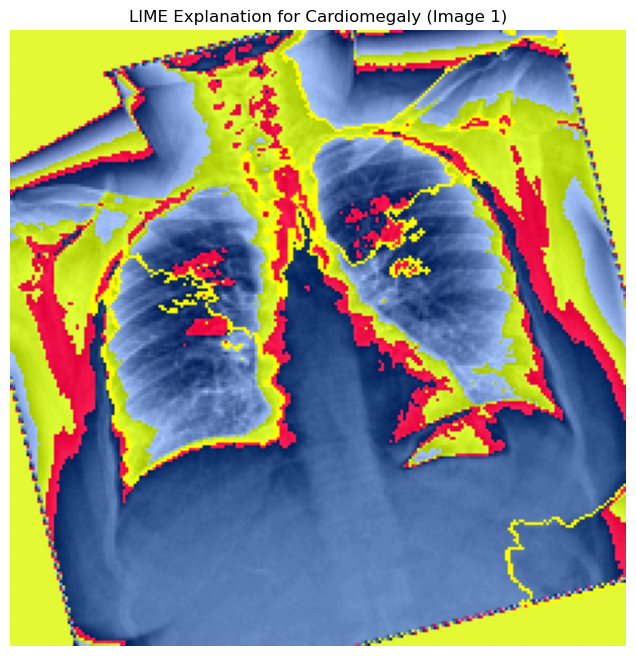

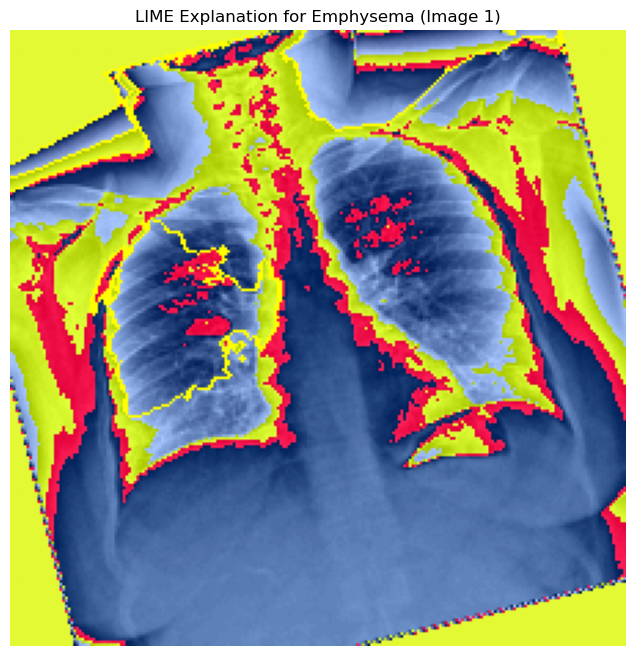

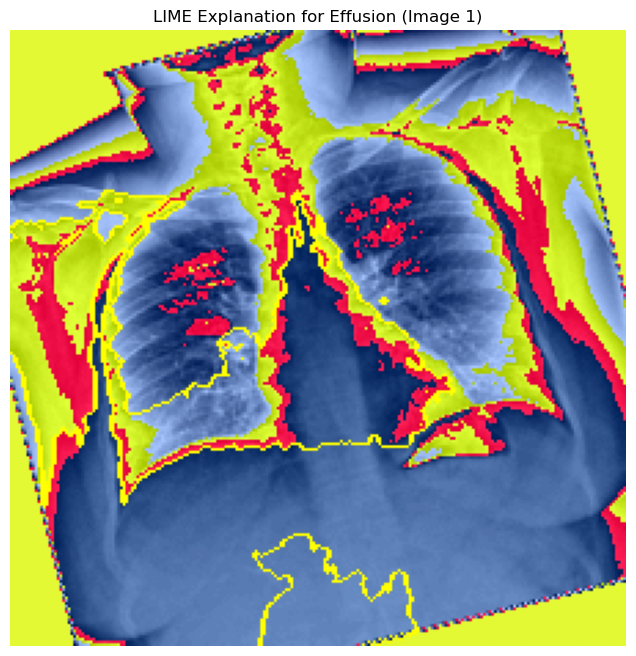

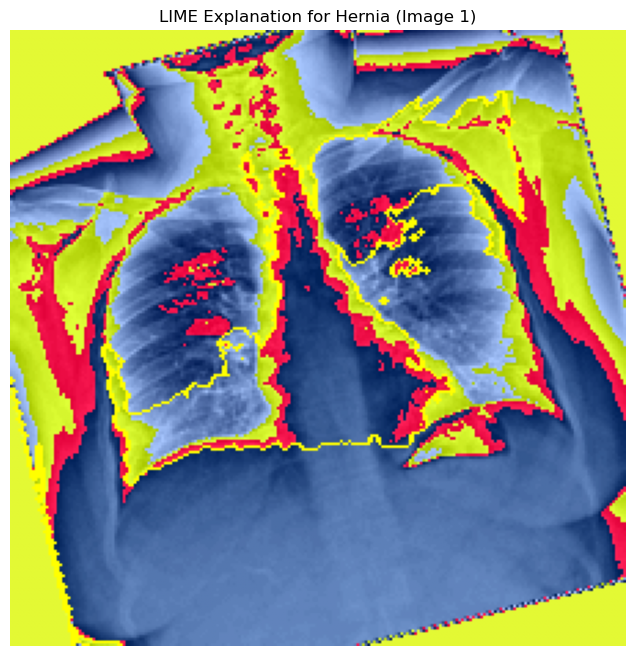

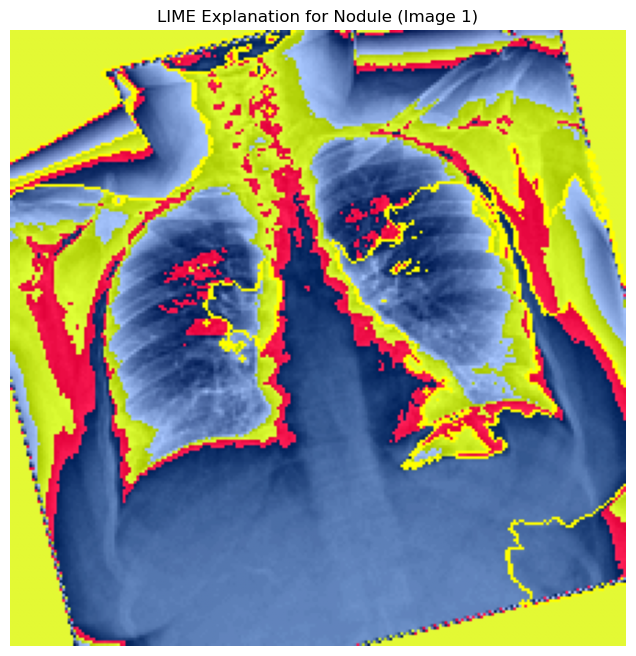

...

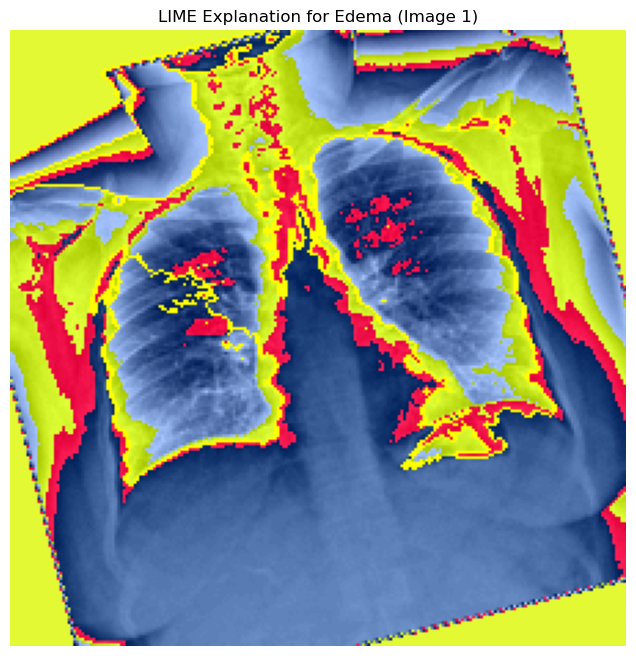

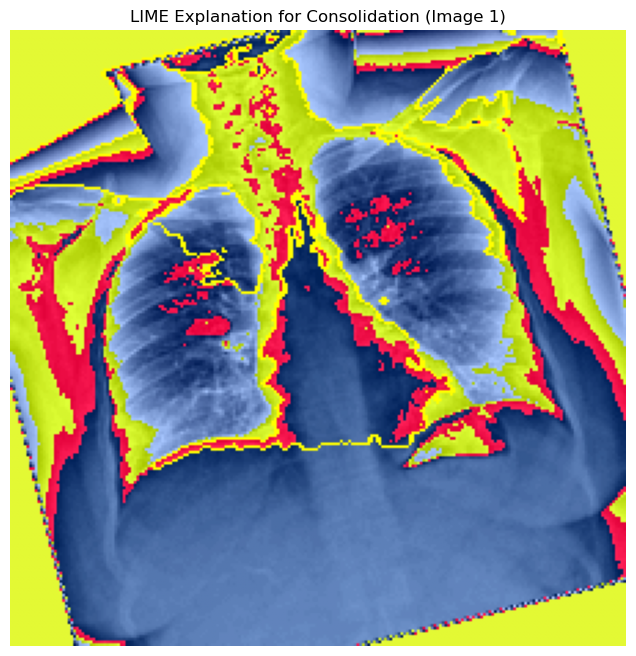

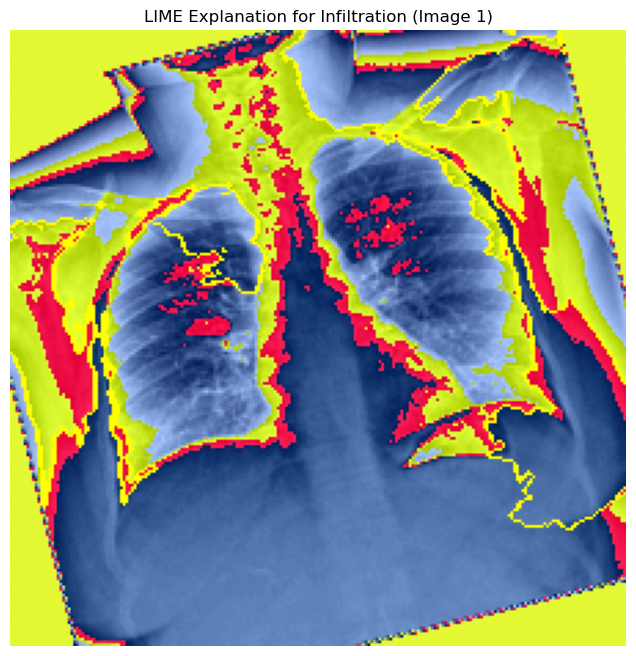

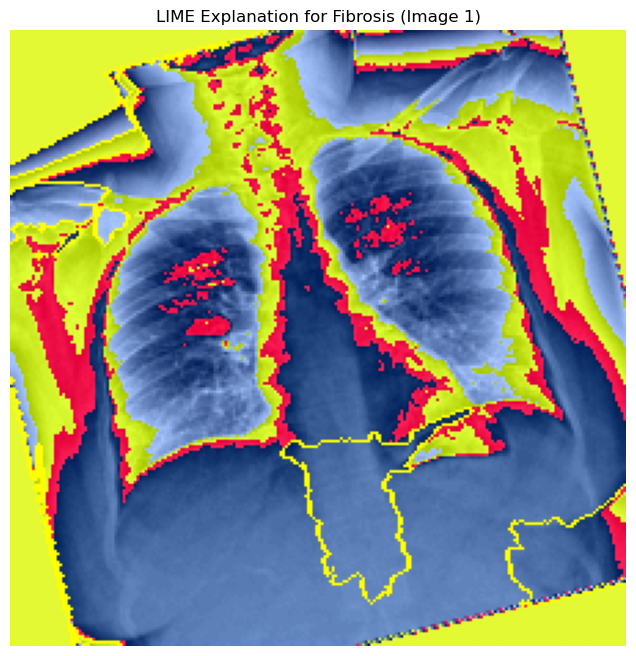

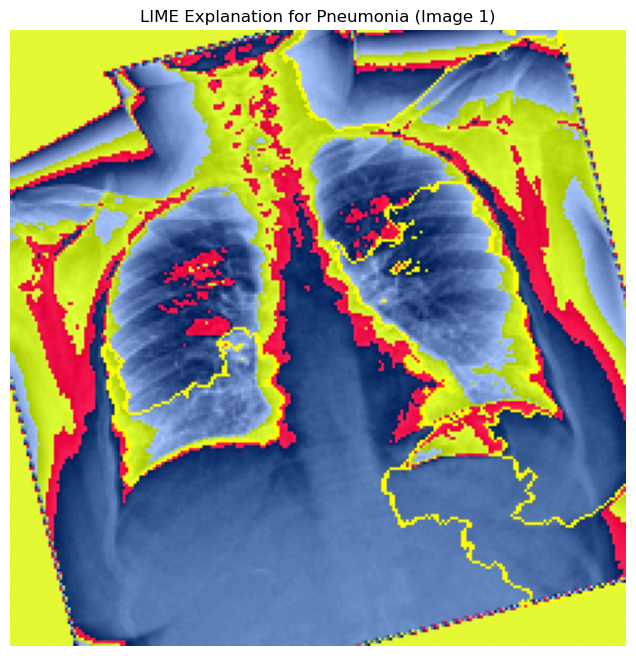

In [6]:
# Iterate over the first five images in the test set
for idx in range(1):
  image, label = testset[idx]
  image_pil = to_pil_image(image)
  if image_pil.mode != 'RGB':
    image_pil = image_pil.convert('RGB')
  image_np = np.array(image_pil)  # Original image for LIME

  # LIME explainer
  explainer = lime_image.LimeImageExplainer()
  explanation = explainer.explain_instance(
    image_np,
    predict_fn_svm,
    top_labels=len(pathology_list),
    hide_color=0,
    num_samples=1000,
    segmentation_fn=lime_image.SegmentationAlgorithm(
      'quickshift', kernel_size=4, max_dist=200, ratio=0.2)
  )

  # Visualize explanation for all labels
  for label_idx in range(len(pathology_list)):
    temp, mask = explanation.get_image_and_mask(
      label_idx, positive_only=True, num_features=5, hide_rest=True
    )
    plt.figure(figsize=(8, 8))
    plt.imshow(mark_boundaries(image_np, mask))
    plt.title(f"LIME Explanation for {pathology_list[label_idx]} (Image {idx + 1})")
    plt.axis('off')
    plt.show()

Data types of pathology columns:
Cardiomegaly          int64
Emphysema             int64
Effusion              int64
Hernia                int64
Nodule                int64
Pneumothorax          int64
Atelectasis           int64
Pleural_Thickening    int64
Mass                  int64
Edema                 int64
Consolidation         int64
Infiltration          int64
Fibrosis              int64
Pneumonia             int64
dtype: object
Missing values in pathology columns:
Cardiomegaly          0
Emphysema             0
Effusion              0
Hernia                0
Nodule                0
Pneumothorax          0
Atelectasis           0
Pleural_Thickening    0
Mass                  0
Edema                 0
Consolidation         0
Infiltration          0
Fibrosis              0
Pneumonia             0
dtype: int64


/home/ozien/anaconda3/envs/rapids-25.02/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/home/ozien/anaconda3/envs/rapids-25.02/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.



+--------------------+------------------+
| Class Name         |   Train Accuracy |
+====================+==================+
| Cardiomegaly       |         0.974359 |
+--------------------+------------------+
| Emphysema          |         0.97748  |
+--------------------+------------------+
| Effusion           |         0.889409 |
+--------------------+------------------+
| Hernia             |         0.997993 |
+--------------------+------------------+
| Nodule             |         0.944705 |
+--------------------+------------------+
| Pneumothorax       |         0.950948 |
+--------------------+------------------+
| Atelectasis        |         0.911483 |
+--------------------+------------------+
| Pleural_Thickening |         0.969454 |
+--------------------+------------------+
| Mass               |         0.951171 |
+--------------------+------------------+
| Edema              |         0.978595 |
+--------------------+------------------+
| Consolidation      |         0.9

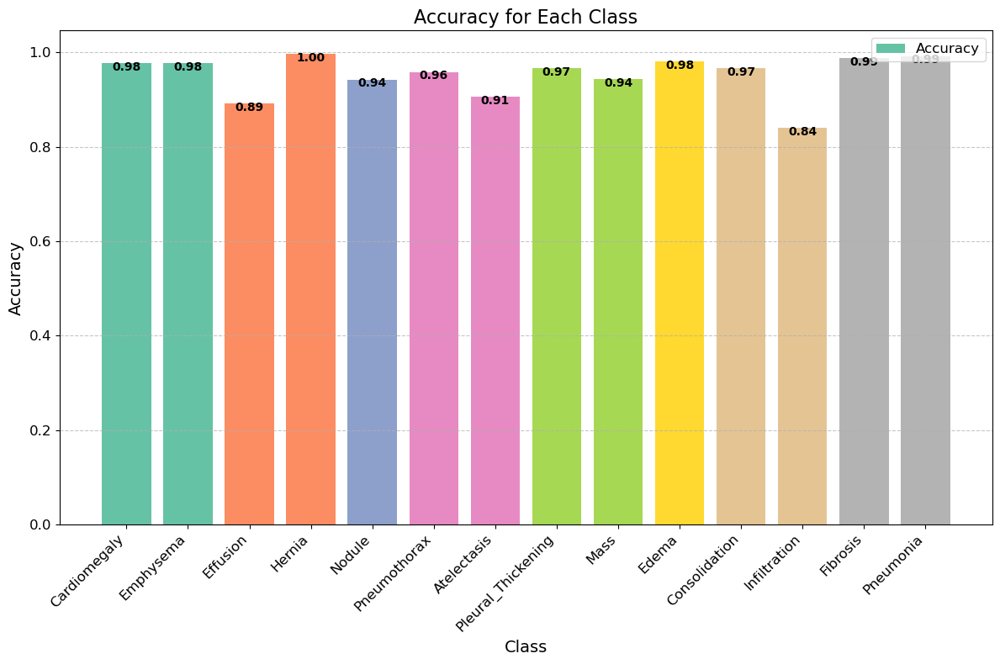

In [7]:
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
from operator import itemgetter
from collections import OrderedDict
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
import torch
from torch import optim, nn
import torch.nn.functional as F
from torchvision import transforms as T, models
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision.utils import make_grid
from torch.utils.data import random_split
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.multioutput import MultiOutputClassifier
from sklearn.metrics import accuracy_score
from tabulate import tabulate
from lime import lime_image
from skimage.segmentation import mark_boundaries
from torchvision.transforms.functional import to_pil_image

# Set plotting backend and device
pd.options.plotting.backend = "plotly"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load and preprocess data
data = pd.read_csv(
    '/home/ozien/Untitled Folder/XAI/Data/Sample/sample_labels.csv')
data['Patient Gender'].value_counts().plot.bar()

# Handle 'Patient Age'
data['Patient Age'] = data['Patient Age'].astype(str)
data['Patient Age'] = data['Patient Age'].apply(
    lambda x: int(x[1:3]) if len(x) > 2 and x[1:3].isdigit() else None)
data = data.dropna(subset=['Patient Age'])
data['Patient Age'].plot.hist()

# Define pathology list and create binary labels
pathology_list = ['Cardiomegaly', 'Emphysema', 'Effusion', 'Hernia', 'Nodule', 'Pneumothorax', 'Atelectasis',
                  'Pleural_Thickening', 'Mass', 'Edema', 'Consolidation', 'Infiltration', 'Fibrosis', 'Pneumonia']
for pathology in pathology_list:
    data[pathology] = data['Finding Labels'].apply(
        lambda x: 1 if pathology in x else 0).astype(int)
data['No Findings'] = data['Finding Labels'].apply(
    lambda x: 1 if 'No Finding' in x else 0).astype(int)
data = data.drop(list(data.iloc[:, 1:11].columns.values), axis=1)
data.iloc[:, 1:].sum().plot.barh()
data = data.drop(['No Findings'], axis=1)
data.iloc[:, 1:].sum().plot.barh()

# Verify data types and check for missing values
print("Data types of pathology columns:")
print(data[pathology_list].dtypes)
print("Missing values in pathology columns:")
print(data[pathology_list].isna().sum())
data = data.dropna(subset=pathology_list)

# Compute class frequencies


def compute_class_freqs(labels):
    labels = np.array(labels)
    N = labels.shape[0]
    positive_frequencies = np.sum(labels, axis=0) / N
    negative_frequencies = 1 - positive_frequencies
    return positive_frequencies, negative_frequencies


freq_pos, freq_neg = compute_class_freqs(data.iloc[:, 1:])
pos_weights = freq_neg
neg_weights = freq_pos

# Dataset class


class NIH_Dataset(Dataset):
    def __init__(self, data, img_dir, transform=None):
        self.data = data
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_file = os.path.join(self.img_dir, self.data.iloc[idx, 0])
        img = Image.open(img_file).convert('RGB')
        label = torch.tensor(self.data.iloc[idx, 1:].values.astype(
            np.float32), dtype=torch.float32)
        if self.transform:
            img = self.transform(img)
        return img, label


# Data transformations
data_transform = T.Compose([
    T.RandomRotation((-20, +20)),
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create dataset and split into train/test
trainds = NIH_Dataset(
    data, img_dir='/home/ozien/Untitled Folder/XAI/Data/Sample/sample/images', transform=data_transform)
trainset, testset = random_split(trainds, [4485, 1121])
trainloader = DataLoader(trainset, batch_size=32, shuffle=True)
testloader = DataLoader(testset, batch_size=32, shuffle=True)

# Feature extraction using VGG16 convolutional base
vgg_model = models.vgg16(pretrained=True)
vgg_feature_extractor = nn.Sequential(
    vgg_model.features,                # Convolutional layers
    nn.AdaptiveAvgPool2d((1, 1)),      # Reduce to (batch_size, 512, 1, 1)
    nn.Flatten()                       # Output (batch_size, 512)
).to(device)
vgg_feature_extractor.eval()

# Function to extract features


def extract_features(loader, model):
    features = []
    labels = []
    model.eval()
    with torch.no_grad():
        for images, targets in loader:
            images = images.to(device)
            outputs = model(images)
            features.extend(outputs.cpu().numpy())
            labels.extend(targets.cpu().numpy())
    return features, labels


# Extract features for training and testing
train_features, train_labels = extract_features(
    trainloader, vgg_feature_extractor)
test_features, test_labels = extract_features(
    testloader, vgg_feature_extractor)

# Convert labels to 2D arrays
train_labels = np.vstack(train_labels)  # Shape: (n_samples, 14)
test_labels = np.vstack(test_labels)    # Shape: (n_samples, 14)
train_features = np.array(train_features)  # Shape: (n_samples, 512)
test_features = np.array(test_features)

# Apply PCA
n_components = min(len(train_features), 512, 1000)
pca = PCA(n_components=n_components)
train_features_reduced = pca.fit_transform(train_features)
test_features_reduced = pca.transform(test_features)

# Train multi-label SVM
svm_classifier = SVC(kernel='rbf', probability=True)
multi_label_svm = MultiOutputClassifier(svm_classifier)
multi_label_svm.fit(train_features_reduced, train_labels)

# Predictions
train_predictions = multi_label_svm.predict(train_features_reduced)
test_predictions = multi_label_svm.predict(test_features_reduced)

# Calculate class-wise accuracies
train_labels_array = np.array(train_labels)
train_predictions_array = np.array(train_predictions)
train_class_accuracies_svm = [accuracy_score(
    train_labels_array[:, i], train_predictions_array[:, i]) for i in range(len(pathology_list))]

test_labels_array = np.array(test_labels)
test_predictions_array = np.array(test_predictions)
test_class_accuracies_svm = [accuracy_score(
    test_labels_array[:, i], test_predictions_array[:, i]) for i in range(len(pathology_list))]

# Print accuracies
data_train = zip(pathology_list, train_class_accuracies_svm)
print(tabulate(data_train, headers=[
      'Class Name', 'Train Accuracy'], tablefmt='grid'))

data_test = zip(pathology_list, test_class_accuracies_svm)
print(tabulate(data_test, headers=[
      'Class Name', 'Test Accuracy'], tablefmt='grid'))

average_test_accuracy_svm = np.mean(test_class_accuracies_svm)
print(f"Average Test Accuracy across all classes: {average_test_accuracy_svm}")

# Plot accuracies
plt.figure(figsize=(12, 8))
bars = plt.bar(pathology_list, test_class_accuracies_svm,
               color=plt.cm.Set2(np.linspace(0, 1, len(pathology_list))))
for bar, accuracy in zip(bars, test_class_accuracies_svm):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() - 0.02,
             f'{accuracy:.2f}', ha='center', va='bottom', fontsize=10, fontweight='bold', color='black')
plt.title('Accuracy for Each Class', fontsize=16)
plt.xlabel('Class', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(['Accuracy'], loc='upper right', fontsize=12)
plt.tight_layout()
plt.show()

# LIME Explanation
# Preprocessing for LIME (same as training)
preprocess = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Prediction function for LIME


def predict_fn_svm(images):
    batch = [preprocess(Image.fromarray(
        (img * 255).astype(np.uint8), 'RGB')) for img in images]
    batch_tensor = torch.stack(batch).to(device)
    with torch.no_grad():
        features = vgg_feature_extractor(batch_tensor).cpu().numpy()
    reduced_features = pca.transform(features)
    probs = multi_label_svm.predict_proba(reduced_features)
    positive_probs = np.hstack([prob[:, 1].reshape(-1, 1) for prob in probs])
    return positive_probs.astype(np.float64)

  0%|          | 0/1000 [00:00<?, ?it/s]

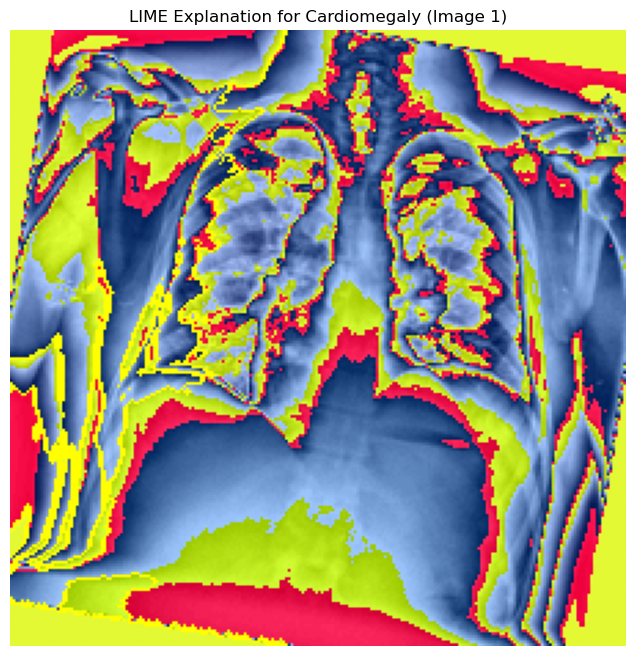

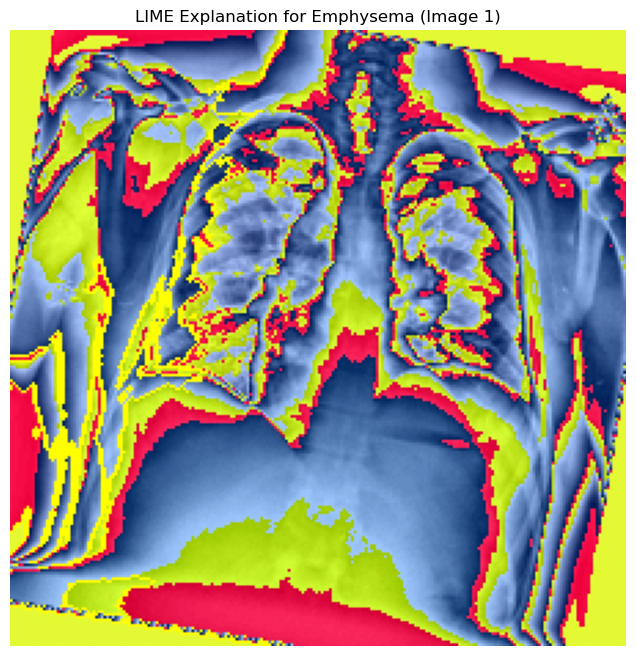

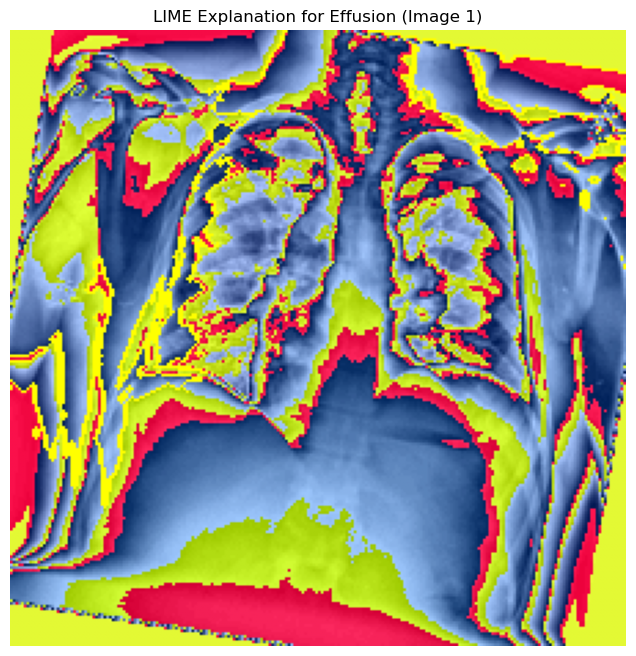

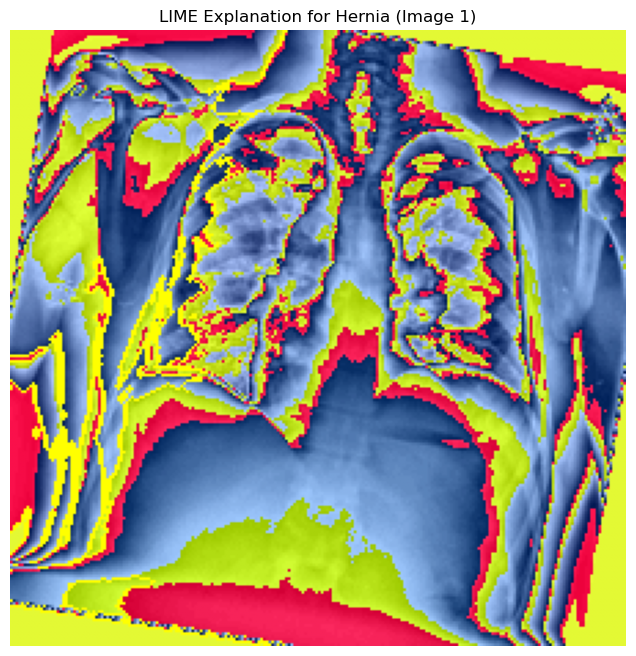

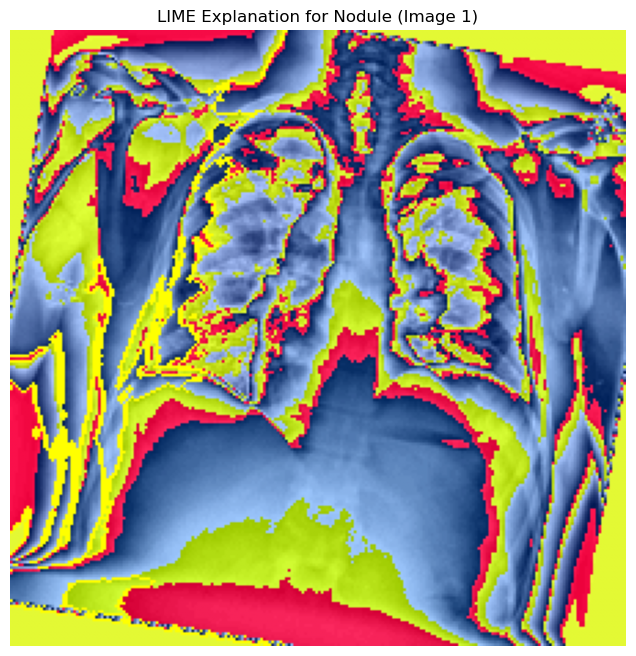

...

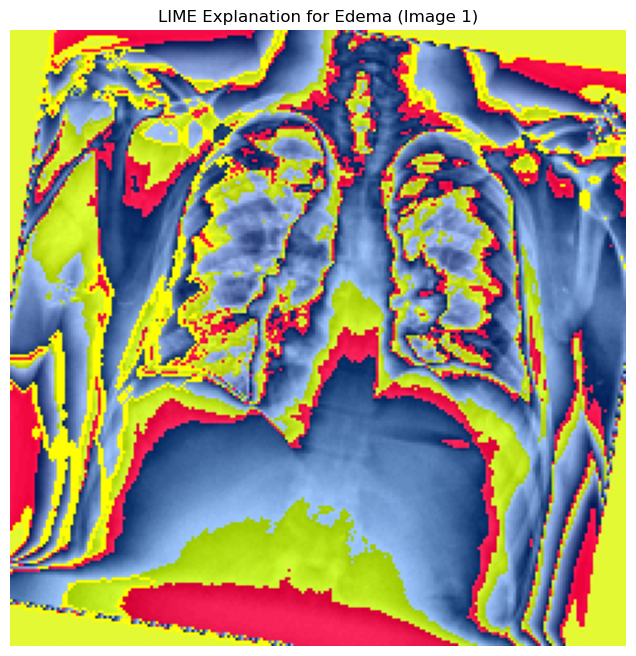

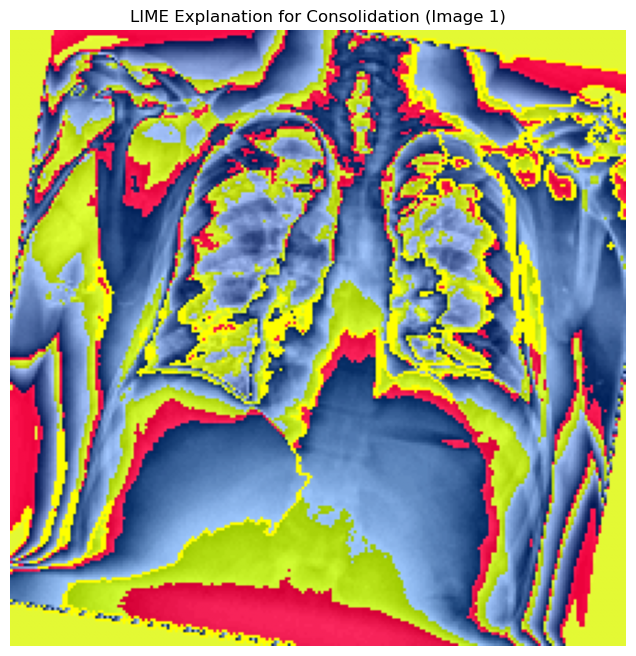

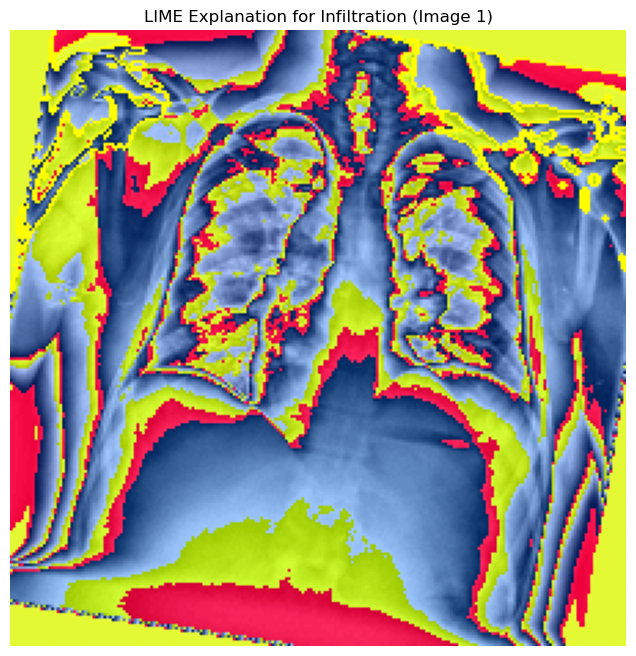

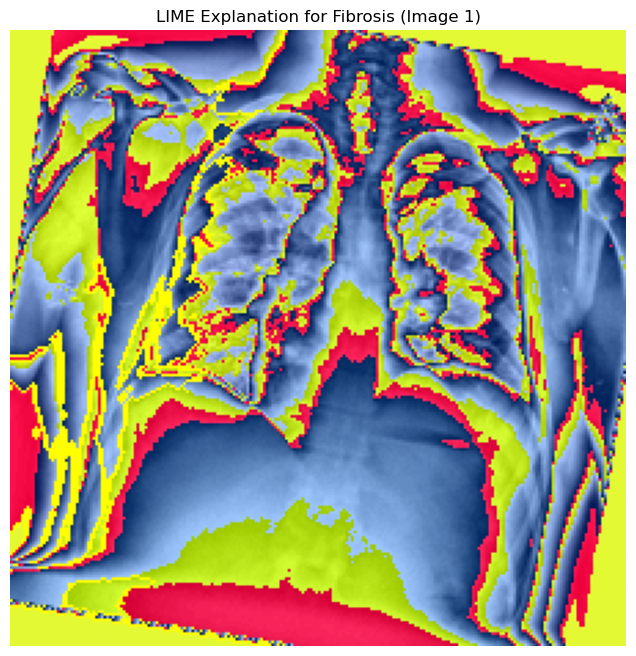

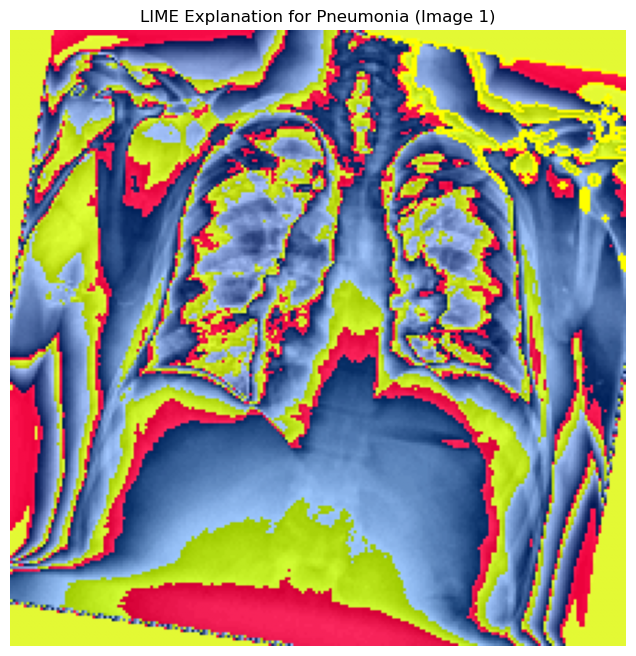

In [ ]:
# Iterate over the first five images in the test set
for idx in range(1):
  image, label = testset[idx]
  image_pil = to_pil_image(image)
  if image_pil.mode != 'RGB':
    image_pil = image_pil.convert('RGB')
  image_np = np.array(image_pil)  # Original image for LIME

  # LIME explainer
  explainer = lime_image.LimeImageExplainer()
  explanation = explainer.explain_instance(
      image_np,
      predict_fn_svm,
      top_labels=len(pathology_list),
      hide_color=0,
      num_samples=1000,
      segmentation_fn=lime_image.SegmentationAlgorithm(
          'quickshift', kernel_size=4, max_dist=200, ratio=0.2)
  )

  # Visualize explanation for all labels
  for label_idx in range(len(pathology_list)):
    temp, mask = explanation.get_image_and_mask(
        label_idx, positive_only=True, num_features=5, hide_rest=True
    )
    plt.figure(figsize=(8, 8))
    plt.imshow(mark_boundaries(image_np, mask))
    plt.title(
        f"LIME Explanation for {pathology_list[label_idx]} (Image {idx + 1})")
    plt.axis('off')
    plt.show()